Copyright 2023, The Authors.

Licensed under the Apache License, Version 2.0 (the "License"); you may not use this file except in compliance with the License.

You may obtain a copy of the License at
    https://www.apache.org/licenses/LICENSE-2.0


Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.


See the License for the specific language governing permissions and limitations under the License.


In [ ]:
!pip install seaborn==0.12.1
!pip install matplotlib==3.6.2
!pip install statsmodels=0.14.0
!pip install pyarrow

In [2]:
#@title Imports
import collections
import enum
import io
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import seaborn as sns

import statsmodels.api as sm
from statsmodels.multivariate.manova import MANOVA
from statsmodels.formula.api import ols


In [3]:
#@title Utility functions

_REWARD_OUTCOME = "R"
_SUCKER_OUTCOME = "S"
_TEMPTATION_OUTCOME = "T"
_PUNISHMENT_OUTCOME = "P"

_BASE_KEY = "BASE"
_VOLATILITY_KEY = "VOL"

# The labels of the traits in the genotype, in order.
labels = (_BASE_KEY, _VOLATILITY_KEY, _REWARD_OUTCOME, _TEMPTATION_OUTCOME,
          _PUNISHMENT_OUTCOME, _SUCKER_OUTCOME)


def import_data(path: str) -> pd.DataFrame:
  base_path = 'https://storage.googleapis.com/emotions_courtship/data'
  full_path = f'{base_path}/{path}'
  response = requests.get(full_path)
  with io.BytesIO(response.content) as f:
    return pd.read_feather(f)


def sigmoid(x: float) -> float:
  """A sigmoid function."""
  x_stretch = x * 4 - 1
  return np.clip(x_stretch, 0, 2) / 2


def is_masked(bit: int, mask: int) -> bool:
  """Test whether a particular bit of a mask is set."""
  return ((1 << bit) & mask) != 0


def prepare_dataframe(df: pd.DataFrame) -> pd.DataFrame:
  """Post process dataframe to include utility columns for easy plotting."""
  df["playdiv"] = df['allowplay'].astype(str)+df['allowdivorce'].astype(str)
  df["Noise"] = df['noise'].astype(str)+" " + df['noisetype'].astype(str)
  df['playcostc'] =  df['playcost'].astype(str)
  df['deceitcostc'] =  df['deceitcost'].astype(str)
  df['divorcecostc'] =  df['divorcecost'].astype(str)
  df["Deceit"] = df['deceitcost'].astype(str)+" " + df['allowdeceit'].astype(str)
  df.replace(to_replace={'0.0 False': 'N/A', '0.0 True': '0.0', '0.4 True': '0.4',
                        '0.8 True': '0.8', '1.2 True': '1.2', '1.6 True': '1.6'},
            inplace=True, limit=None, regex=False)
  df["Costs: Divorce"] = (
      df['divorcecost'].astype(str) + " " + df['allowdivorce'].astype(str))
  df.replace(
      to_replace={'0.0 False': 'N/A', '0.0 True': '0.0', '2.0 True': '2.0',
                  '4.0 True': '4.0', '8.0 True': '8.0', '16.0 True': '16.0'},
      inplace=True, limit=None, regex=False)
  df["Costs: Play"] = (
      df['playcost'].astype(str) + " " + df['allowplay'].astype(str))
  df.replace(
      to_replace={'0.0 False': 'N/A', '0.0 True': '0.0', '0.8 True': '0.8',
                  '0.2 True': '0.2', '0.4 True': '0.4', '0.6 True': '0.6'},
      inplace=True, limit=None, regex=False)
  df['EmoCourt'] = df['emotions'].astype(str)+" " + df['Costs: Play'].astype(str)
  df['EmoCourt'].replace(
      to_replace={'False N/A': 'No emotions or courtship',
                  'False 0.0': 'Courtship, no emotions',
                  'True N/A': 'Emotions, no courtship',
                  'True 0.0': 'Emotions and courtship'},
      inplace=True, limit=None, regex=False)
  df['Mutual Cooperation'] = df['p_R']
  return df.reset_index()


def genotype_to_vector(genotype: dict, mask: int = 0x0) -> np.ndarray:
  """Convert a genotype, given as a dictionary, to a flat-vector."""
  emotions = ('attach', 'cooper', 'deceit', 'play')
  as_array = np.array([
      [genotype[emotion][label] for label in labels]
      for emotion in emotions
  ])
  for i, label in enumerate(labels):
    # If detaching deterministically, mask the rest of this label
    if (not is_masked(0, mask)  # Attachment is considered (allowdivorce = True)
        and i != 1  # This is not the decay trait (v)
        and as_array[0][1] == 0  # Decay is small [0 - 0.25)
        and as_array[0][i] == 0):  # And outcome is [-1, -0.5)
      per_label_mask = 14  # (1110)_2 i.e. mask everything except attachment.
    else:
      # By default show it
      per_label_mask = mask
    for j, emotion in enumerate(emotions):
      if is_masked(j, per_label_mask) or (
          i == 1 and is_masked(4, per_label_mask)):
        as_array[j, i] = -1
  return as_array.flatten()


def vector_to_genotype(vector: np.ndarray) -> dict:
  """Convert a flat-vector representation of a genotype to a dictionary."""
  emotions = ('attach', 'cooper', 'deceit', 'play')
  array = vector.reshape((len(emotions), len(labels)))
  genotype = collections.defaultdict(dict)
  for i, emotion in enumerate(emotions):
    for j, label in enumerate(labels):
      genotype[emotion][label] = array[i, j]
  return genotype


def extract_gene(agent_vec: np.ndarray, emotion: str, trait: str) -> int:
  """Extract the gene value associated with an emotion and trait."""
  labels_to_index = {_BASE_KEY: 0, _VOLATILITY_KEY: 1, _REWARD_OUTCOME: 2, _TEMPTATION_OUTCOME: 3, _PUNISHMENT_OUTCOME: 4, _SUCKER_OUTCOME: 5}
  emotions = {'attach': 0, 'cooper': 1, 'deceit': 2, 'play': 3}
  assert emotion in emotions
  assert trait in labels_to_index
  index = emotions[emotion] * 6 + labels_to_index[trait]
  return agent_vec[index]


def get_mask_for_row(row: pd.Series) -> int:
  """Get the binary filter mask of irrelevant genes based on given params."""
  mask = 0
  mask |= 0 if row['allowdivorce'] else 1
  mask |= 0 if row['allowdeceit'] else 4
  mask |= 0 if row['allowplay'] else 8
  mask |= 0 if row['emotions'] else 16  # mask decay
  return mask


In [4]:
#@title Load data (**WARNING**: Downloads ~1GB of data, takes few minutes)

df_full = import_data("full_cross/full_cross.feather")
df_genotypes = import_data("genotypes/genotypes.feather")

df_chicken = import_data("sensitivity/chicken.feather")
df_death_and_pop_size = import_data("sensitivity/death_and_pop_size.feather")
df_initial_trait = import_data("sensitivity/initial_trait.feather")
df_initial_trait_low_dev = import_data("sensitivity/initial_trait_low_dev.feather")
df_mutation = import_data("sensitivity/mutation.feather")
df_new_relationships = import_data("sensitivity/new_relationships.feather")
df_smooth_sigmoid = import_data("sensitivity/smooth_sigmoid.feather")
df_staghunt = import_data("sensitivity/staghunt.feather")

# Fully crossed design analysis (**Fig. 2**)

In [5]:
#@title Prepare `full_cross` dataframe (takes a few minutes)
df = prepare_dataframe(df_full)

In [6]:
#@title Util for **Fig. 2** subplots

def plot_emocourt_vs_noise_and_save(dataframe: pd.DataFrame, title: str,
                                    with_legend: bool = False,
                                    ylabel: str = 'Mutual Cooperation'):
  def_pal = sns.color_palette()
  hue_order = ['No emotions or courtship', 'Emotions, no courtship',
               'Courtship, no emotions', 'Emotions and courtship']
  palette = [def_pal[7], '#CC6677', '#44AA99', '#DDCC77']

  plt.figure(figsize=(2.3, 2.3))

  sns.stripplot(dataframe, x='noise', y='Mutual Cooperation',
                order=[0.0, 0.04, 0.08, 0.12, 0.16, 0.20],
                native_scale=True,
                size=1.5,
                hue='EmoCourt',
                legend=False,
                hue_order=hue_order,
                palette=palette)
  ax = sns.lineplot(dataframe, x='noise', y='Mutual Cooperation',
                    hue='EmoCourt',
                    legend=with_legend,
                    hue_order=hue_order,
                    palette=palette)
  ax.set_ylabel(ylabel)
  plt.xlabel('Noise level')
  plt.title(title)
  if with_legend:
    plt.legend(title='Condition')
    sns.move_legend(ax, (1.1, 0.3))

  plt.show()


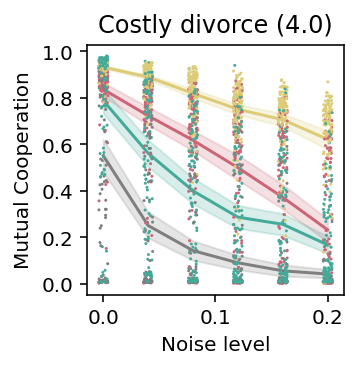

In [7]:
#@title Baseline scenario
deceitcost_facet = 0.0
divorcecost_facet = 4.0
playcost_facet = 0.0
allowdeceit_facet = False
allowdivorce_facet = True
noisetype_facet = "percept"
deaths_facet = 0.01
mutation_facet = 0.04
population_facet = 500

df_fig1a = df[
    (df.deceitcost == deceitcost_facet) &
    (df.divorcecost == divorcecost_facet) &
    (df.playcost == playcost_facet) &
    (df.allowdeceit == allowdeceit_facet) &
    (df.allowdivorce == allowdivorce_facet) &
    ((df.noisetype == noisetype_facet) | (df.noisetype == 'neither')) &
    (df.deaths == deaths_facet) &
    (df.mutation == mutation_facet) &
    (df.population == population_facet)
]

plot_emocourt_vs_noise_and_save(df_fig1a, 'Costly divorce (4.0)')#, with_legend=True)

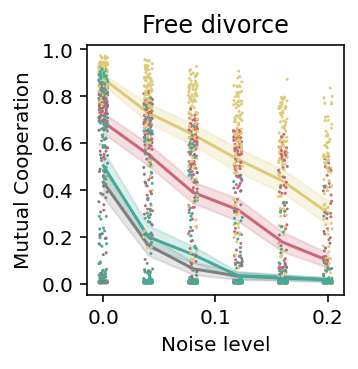

In [8]:
#@title Free divorce
df_fig1b = df[
    (df.deceitcost == deceitcost_facet) &
    (df.divorcecost == 0.0) &
    (df.playcost == playcost_facet) &
    (df.allowdeceit == allowdeceit_facet) &
    (df.allowdivorce == allowdivorce_facet) &
    ((df.noisetype == noisetype_facet) | (df.noisetype == 'neither')) &
    (df.deaths == deaths_facet)
]
plot_emocourt_vs_noise_and_save(df_fig1b, 'Free divorce')

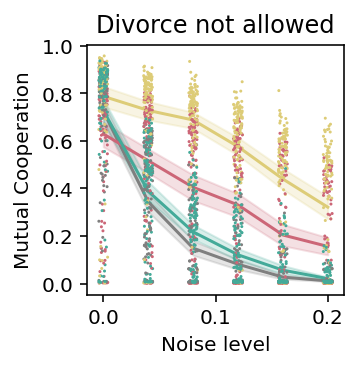

In [9]:
#@title Divorce not allowed
df_fig1c = df[
    (df.deceitcost == deceitcost_facet) &
    (df.playcost == playcost_facet) &
    (df.allowdeceit == allowdeceit_facet) &
    (df.allowdivorce == False) &
    ((df.noisetype == noisetype_facet) | (df.noisetype == 'neither')) &
    (df.deaths == deaths_facet)
]
plot_emocourt_vs_noise_and_save(df_fig1c, 'Divorce not allowed')

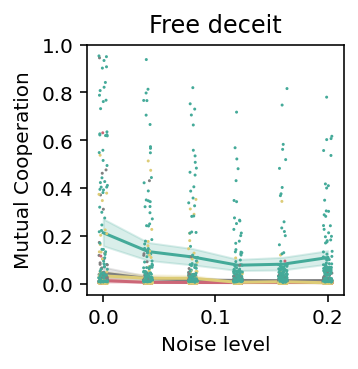

In [10]:
#@title Free deceit
df_fig1d = df[
    (df.deceitcost == 0.0) &
    (df.divorcecost == divorcecost_facet) &
    (df.playcost == playcost_facet) &
    (df.allowdeceit == True) &
    (df.allowdivorce == allowdivorce_facet) &
    ((df.noisetype == noisetype_facet) | (df.noisetype == 'neither')) &
    (df.deaths == deaths_facet)
]
plot_emocourt_vs_noise_and_save(df_fig1d, 'Free deceit')

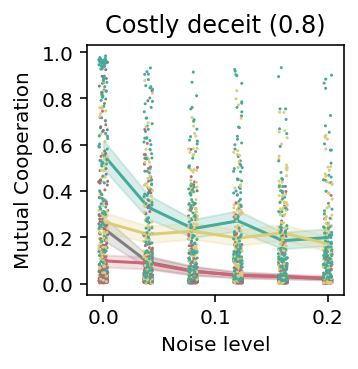

In [11]:
#@title Costly deceit (0.8)
df_fig1e = df[
    (df.deceitcost == 0.8) &
    (df.divorcecost == divorcecost_facet) &
    (df.playcost == playcost_facet) &
    (df.allowdeceit == True) &
    (df.allowdivorce == allowdivorce_facet) &
    ((df.noisetype == noisetype_facet) | (df.noisetype == 'neither')) &
    (df.deaths == deaths_facet)
]
plot_emocourt_vs_noise_and_save(df_fig1e, 'Costly deceit (0.8)')

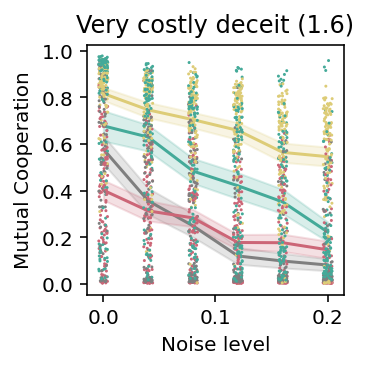

In [12]:
#@title Very costly deceit (1.6)
df_fig1f = df[
    (df.deceitcost == 1.6) &
    (df.divorcecost == divorcecost_facet) &
    (df.playcost == playcost_facet) &
    (df.allowdeceit == True) &
    (df.allowdivorce == allowdivorce_facet) &
    ((df.noisetype == noisetype_facet) | (df.noisetype == 'neither')) &
    (df.deaths == deaths_facet)
]
plot_emocourt_vs_noise_and_save(df_fig1f, 'Very costly deceit (1.6)')

# Histograms (**Fig. 3**)


In [13]:
#@title Classify strategies utils

STRAT_CLASSES = ['GRIM', 'GRIMi', 'TFT_', 'WSLS', 'WSLSi', 'ALLC']
STRAT_SUBCLASSES = ['RcoSc', 'RcoSd', 'RdiSc', 'RdiSd', 'RdeSc', 'RdeSd']
strats = {}
CLASS_NAME = {}
i = 0
CLASS_NUM = {}
for strat_classes in STRAT_CLASSES:
    for substrats in STRAT_SUBCLASSES:
        strats[i] = 0
        CLASS_NAME[i] = str(strat_classes+substrats)
        CLASS_NUM[str(strat_classes+substrats)] = i
        i+=1

def make_responses(agent_vec, emotion, start_point = -1):
    r = {}
    for resp in (_REWARD_OUTCOME, _TEMPTATION_OUTCOME, _PUNISHMENT_OUTCOME, _SUCKER_OUTCOME):
        vol = abs(extract_gene(agent_vec, emotion, _VOLATILITY_KEY))
        if vol != 1:
            r[resp] = start_point + 2 * extract_gene(agent_vec, emotion, resp)
            r[resp] = r[resp] + (extract_gene(agent_vec, emotion, _BASE_KEY)
                                 - r[resp]) * vol
        else:
            r[resp] = extract_gene(agent_vec, emotion, resp)
    return r


def classify_agent(agent, mask, threshold=0.0, start_point= -1):
    agent_vec = genotype_to_vector(agent, mask)

    coop_response = make_responses(agent_vec, 'cooper', start_point)
    spa = start_point
    if spa == -1.0:
        spa = -0.5
    att_response = make_responses(agent_vec, 'attach', spa)
    action = {}
    for resp in (_REWARD_OUTCOME, _TEMPTATION_OUTCOME, _PUNISHMENT_OUTCOME, _SUCKER_OUTCOME):
        if att_response[resp] < threshold:
            action[resp] = "div"
        elif coop_response[resp] > threshold:
            action[resp] = "coop"
        else:
            action[resp] = "def"
    aR, aT, aP, aS = action[_REWARD_OUTCOME], action[_TEMPTATION_OUTCOME], action[_PUNISHMENT_OUTCOME], action[_SUCKER_OUTCOME]

    strat_class = ''
    if aT == 'coop':
        if aP == 'coop':  # coop always
            strat_class = 'ALLC'
        else:
            strat_class = 'TFT_'  # defect|divorce on P, coop on T
    elif aT == 'def':
        if aP == 'coop':
            strat_class = 'WSLS'  # def on T, coop on P
        else:
            strat_class = 'GRIM'  # div|def on T|P
    else:
        if aP == 'coop':
            strat_class = 'WSLSi'  # coop on P, div on T
        else:
            strat_class = 'GRIMi'  # div|def on T|P
    if aR == 'def':
        sub_strat = 'Rde'
    elif aR == 'div':
        sub_strat = 'Rdi'
    else:
        sub_strat = 'Rco'
    if aS == 'coop':
        sub_strat += 'Sc'
    else:
        sub_strat += 'Sd'
    strat = str(strat_class+sub_strat)
    return CLASS_NUM[strat]

def classify_agents(agents, mask, threshold, start_point):
    histogram = collections.defaultdict(int)
    for strat in CLASS_NUM.values():
        histogram[strat] = 0
    for agent in agents:
        histogram[classify_agent(agent, mask, threshold=threshold,
                                 start_point=start_point)] += 1
    return histogram


def process_row(row, threshold, start_point=0.0):
    mask = get_mask_for_row(row)
    if isinstance(row['agents'], str):
        row['agents'] = eval(row['agents'])
    return classify_agents(row['agents'], mask, threshold=threshold,
                           start_point=start_point)


def hist_facet(hist_df, divcost, deccost, playcost, dec, div, play, emo, deaths,
               mutation, start_point):
    if dec == False:
        deccost = 0.0
    if div == False:
        divcost = 0.0
    if play == False:
        playcost = 0.0
    hfacet_df = hist_df[
        (hist_df.divorcecost == divcost) &
        (hist_df.deceitcost == deccost) &
        (hist_df.playcost == playcost) &
        (hist_df.allowdeceit == dec) &
        (hist_df.allowdivorce == div) &
        (hist_df.allowplay == play) &
        (hist_df.emotions == emo) &
        (hist_df.deaths == deaths) &
        (hist_df.mutation == mutation) &
        (hist_df.noisetype != 'action') &
        (hist_df.start_point == start_point)
    ]
    return hfacet_df


def figure_3_facet(hist_df):
  return hist_df.loc[
      (hist_df.divorcecost == 4.0) &
      (
          ((hist_df.deceitcost == 1.6) & (hist_df.allowdeceit == True)) |
          ((hist_df.deceitcost == 0.0) & (hist_df.allowdeceit == False))
      ) &
      (hist_df.playcost == 0.0) &
      (hist_df.allowdivorce == True) &
      (hist_df.deaths == 0.01) &
      (hist_df.mutation == 0.04)
  ].copy()


In [14]:
#@title Classify strategies and make histogram
fig3_df = figure_3_facet(df_genotypes)

param_names = {'allowdeceit', 'allowdivorce', 'allowplay', 'deaths',
               'deceitcost', 'divorcecost', 'emotions', 'mutation', 'noise',
               'noisetype', 'playcost'}
fig3_columns = ['agents'] + list(param_names)
fig3_df = fig3_df[fig3_columns]

hist_df_raw = pd.DataFrame()
start_point_dfs = []
data = collections.defaultdict(list)

# Process the no-emotions bit (start_point is ignored)
source_df = fig3_df[(fig3_df.emotions == False)]
histogram_data = source_df.apply(
    lambda r: process_row(r, threshold=0.0, start_point=0.0), axis=1)
for histo in histogram_data:
  data['start_point'].append('None')
  for k, name in CLASS_NAME.items():
    data[name].append(histo[k])

tmp = pd.DataFrame(data=data)
start_point_dfs.append(
    pd.concat([tmp.reset_index(), source_df.reset_index()], axis=1)
)

# Then process the emotions bit, with various starting points
source_df = fig3_df[(fig3_df.emotions == True)]
for sp in [-1.0, 0.0, 1.0]:
  data = collections.defaultdict(list)
  histogram_data = source_df.apply(
      lambda r: process_row(r, threshold=0.0, start_point=sp), axis=1)
  for histo in histogram_data:
    data['start_point'].append(sp)
    for k, name in CLASS_NAME.items():
      data[name].append(histo[k])

  tmp = pd.DataFrame(data=data)
  start_point_dfs.append(
      pd.concat([tmp.reset_index(), source_df.reset_index()], axis=1)
  )

hist_df_raw = pd.concat(start_point_dfs)


Strategy prevalence: [('Defector', 343.012), ('Trigger', 200.21200000000002), ('TFT', 174.22799999999998), ('Opportunist', 108.894), ('NoS', 90.19200000000001), ('WSLS', 54.138), ('Cooperator', 49.004000000000005), ('Generous TFT', 39.836000000000006), ('Generous Trigger', 37.242000000000004), ('Quitter', 29.478), ('Generous WSLS', 13.338000000000001), ('Generous Opportunist', 12.426)]
Total prevalence: 1152.0
Prevalence threshold: 5.76
Strategy % prevalences: [29, 17, 15, 9, 7, 4, 4, 3, 3, 2, 1, 1]
Prevalent strategies:  ['Defector', 'Trigger', 'TFT', 'Opportunist', 'NoS', 'WSLS', 'Cooperator', 'Generous TFT', 'Generous Trigger', 'Quitter', 'Generous WSLS', 'Generous Opportunist', 'Other']
Plotting strategies ['Cooperator', 'NoS', 'Trigger', 'Generous Trigger', 'TFT', 'Generous TFT', 'Opportunist', 'Generous Opportunist', 'WSLS', 'Generous WSLS', 'Quitter', 'Defector', 'Other', 'noise']


<ipython-input-15-e256d0db554b>:50: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  (x for x in hist_df.sum(axis=0).items() if x[0] not in param_names),


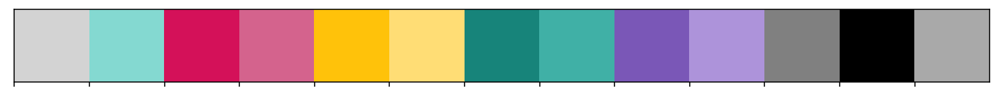

In [15]:
#@title Postprocess histogram data

def merge_strategies(dff, merged_name, to_merge):
  dff[merged_name] = 0
  for strat in to_merge:
    dff[merged_name] = dff[merged_name] + dff[strat]
    del dff[strat]
  return dff

# Merge and rename strategies for Figure 3
hist_df = hist_df_raw.copy()
hist_df = hist_df[
    list(CLASS_NAME.values()) + list(param_names) + ['start_point']]
hist_df = merge_strategies(
    hist_df,
    'Defector',
    ['GRIMRdiSc', 'GRIMRdeSc', 'GRIMRdiSd', 'GRIMRdeSd', 'GRIMiRdiSc',
     'GRIMiRdeSc', 'GRIMiRdiSd', 'GRIMiRdeSd'])
hist_df = merge_strategies(hist_df, 'Trigger', ['GRIMRcoSd', 'GRIMiRcoSd'])
hist_df = merge_strategies(
    hist_df, 'Generous Trigger',['GRIMRcoSc', 'GRIMiRcoSc'])
hist_df = merge_strategies(hist_df, 'WSLS', ['WSLSRcoSd', 'WSLSiRcoSd'])
hist_df = merge_strategies(hist_df, 'Generous WSLS', ['WSLSRcoSc','WSLSiRcoSc'])
hist_df = merge_strategies(hist_df, 'TFT',['TFT_RcoSd'])
hist_df = merge_strategies(hist_df, 'Generous TFT',['TFT_RcoSc'])
hist_df = merge_strategies(hist_df, 'NoS',['ALLCRcoSd'])
hist_df = merge_strategies(hist_df, 'Cooperator',['ALLCRcoSc'])
hist_df = merge_strategies(
    hist_df,
    'Opportunist',
     ['TFT_RdeSd', 'WSLSRdeSd', 'ALLCRdeSd', 'WSLSiRdeSd'])  # Defects on R, def/div on S, but cooperates on P and/or T
hist_df = merge_strategies(
    hist_df,
    'Generous Opportunist',
     ['WSLSRdeSc', 'WSLSiRdeSc', 'TFT_RdeSc', 'ALLCRdeSc'])  # Defects on R, coop on S, P and maybe T
hist_df = merge_strategies(
    hist_df,
    'Quitter',
     ['ALLCRdiSd', 'WSLSiRdiSd', 'WSLSRdiSd', 'TFT_RdiSd', 'WSLSiRdiSc',
      'ALLCRdiSc', 'WSLSRdiSc', 'TFT_RdiSc'])  # Divorces on R, cooperate on T and/or P
strat_names = set(hist_df.columns) - param_names - {'start_point'}

# Sort strategies by prevalence
count = 0
for col in strat_names:
  count += hist_df.iloc[0][col]
for col in strat_names:
  hist_df[col] = hist_df[col] / count
strat_prevalence = sorted(
    (x for x in hist_df.sum(axis=0).items() if x[0] not in param_names),
    key=lambda x: -x[1])
print('Strategy prevalence:', strat_prevalence)
sum_prevalence = sum(x[1] for x in strat_prevalence)
print('Total prevalence:', sum_prevalence)
# Set prevalence threshold for display and collapse rare strategies to 'Other'
prevalence_percent_threshold = 0.5
prevalence_threshold = sum_prevalence * prevalence_percent_threshold / 100
print('Prevalence threshold:', prevalence_threshold)
prevalent_strategies = [strat[0] for strat in strat_prevalence if strat[1] >= prevalence_threshold] + ['Other']
prevalences = [int(100*strat[1]/sum_prevalence) for strat in strat_prevalence]
print('Strategy % prevalences:', prevalences)
to_collapse = [strat[0] for strat in strat_prevalence if strat[1] < prevalence_threshold]
hist_df['Other'] = hist_df[to_collapse].sum(axis=1)
for strat in to_collapse:
  del hist_df[strat]

# Group results by condition
hist_sum_df = hist_df.groupby([
    'allowdeceit', 'allowdivorce', 'allowplay', 'deaths', 'deceitcost',
    'divorcecost', 'emotions', 'mutation', 'noise', 'noisetype', 'playcost',
    'start_point']).mean().reset_index()

# Choose strategies and colors to plot
print("Prevalent strategies: ", prevalent_strategies)
strat_colors = collections.OrderedDict({'Cooperator': 'lightgray', 'NoS': '#84d9d1', 'Trigger':'#D41159', 'Generous Trigger':'#d4638d',  'TFT':'#FFC20A', 'Generous TFT': '#ffdd75',  'Demands T': '#994F00', 'Opportunist': '#17847A', 'Generous Opportunist': '#40B0A6', 'OppNoS': '#40B0A6', 'WSLS': '#7A57B7', 'Generous WSLS': '#AD93DA', 'WSLS div. T': '#40158E', 'Generous WSLS div. T':'#882255', 'OppWSLS': 'red', 'Quitter':'gray', 'Defector':'black', 'Other':'darkgray' })
colors = [strat_colors[i] for i in strat_colors.keys() if i in prevalent_strategies]
strats_to_plot = [i for i in strat_colors.keys() if i in prevalent_strategies]  + ['noise']
print("Plotting strategies", strats_to_plot)
sns.palplot(colors)
for i in prevalent_strategies:
  if i not in strats_to_plot:
    print("Missing ", i)


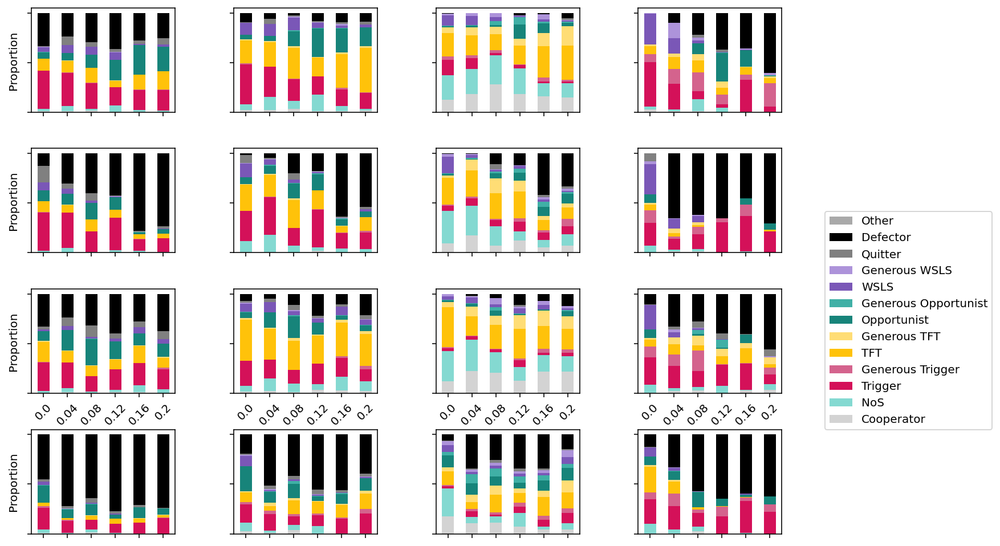

In [16]:
#@title **Fig 3**. Plot histograms of strategies

i = 0
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 7))
fig.tight_layout()

conditions = [
    (False, True, True, -1.0), (False, True, True, 0), (False, True, True, 1.0), (False, True, False, 'None'),
    (False, False, True, -1.0), (False, False, True, 0), (False, False, True, 1.0), (False, False, False, 'None'),
    (True, True, True, -1.0), (True, True, True, 0), (True, True, True, 1.0),  (True, True, False, 'None'),
    (True, False, True, -1.0), (True, False, True, 0), (True, False, True, 1.0),  (True, False, False, 'None'),
]

for dec, play, emo, sp in conditions:
  subset = hist_facet(hist_sum_df, divcost=4.0, deccost=1.6, playcost=0.0, dec=dec, div=True, play=play, emo=emo, deaths=0.01, mutation=0.04, start_point=sp)
  ax = axes[i//4, i%4]
  subset[strats_to_plot].set_index('noise').plot(
      kind='bar',
      stacked=True,
      color=colors,
      ax=ax,
      legend=False)
  if i//4 == 2:
    ax.set_xticklabels(subset.noise.unique(), rotation = 45)
  else:
    ax.set_xticklabels([])
    ax.set_xlabel('')

  if i%4 == 0:
    ax.set_ylabel('Proportion')
    ax.set_yticklabels([])
  else:
    ax.set_yticklabels([])
    ax.set_ylabel('')
  i += 1

handles, labels = ax.get_legend_handles_labels()
handles.reverse()
labels.reverse()

ax.legend(handles, labels, loc=(1.3, 1));


# Supporting Information

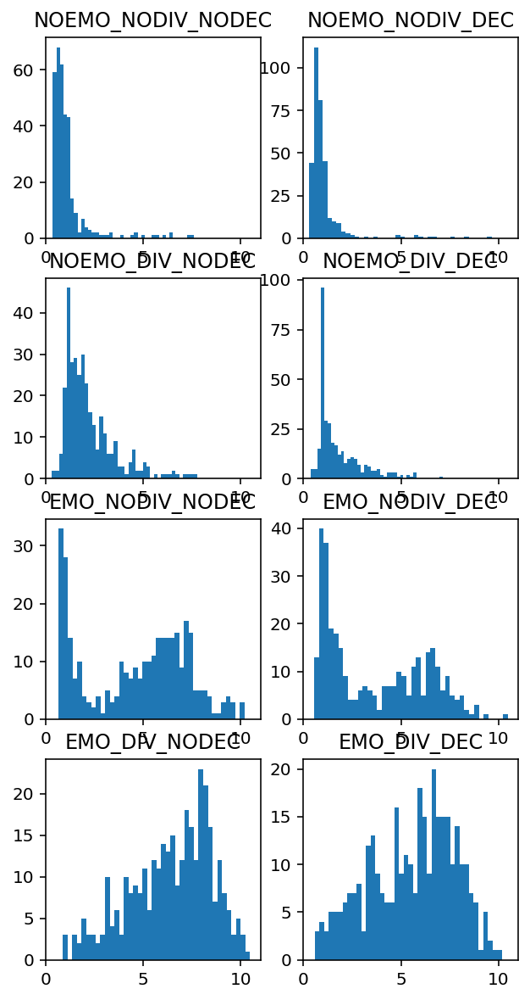

In [17]:
#@title **Fig. S1**: Histograms of average courtship iterations per new relationship

class Facet(enum.Enum):
  NOEMO_NODIV_NODEC = 0
  NOEMO_NODIV_DEC = 1
  NOEMO_DIV_NODEC = 2
  NOEMO_DIV_DEC = 3
  EMO_NODIV_NODEC = 4
  EMO_NODIV_DEC = 5
  EMO_DIV_NODEC = 6
  EMO_DIV_DEC = 7


def _get_facet(df, facet):
  if facet == Facet.EMO_DIV_DEC:
    return df[
        (df.allowplay == True) & (df.emotions == True) &
        (df.allowdivorce == True) & (df.divorcecost == 4.0) &
        (df.allowdeceit == True) & (df.deceitcost == 1.6)
    ]
  elif facet == Facet.EMO_DIV_NODEC:
    return df[
        (df.allowplay == True) & (df.emotions == True) &
        (df.allowdivorce == True) & (df.divorcecost == 4.0) &
        (df.allowdeceit == False)
    ]
  elif facet == Facet.EMO_NODIV_DEC:
    return df[
        (df.allowplay == True) & (df.emotions == True) &
        (df.allowdivorce == False) & (df.allowdeceit == True) &
        (df.deceitcost == 1.6)
    ]
  elif facet == Facet.EMO_NODIV_NODEC:
    return df[
        (df.allowplay == True) & (df.emotions == True) &
        (df.allowdivorce == False) & (df.allowdeceit == False)
    ]
  elif facet == Facet.NOEMO_DIV_DEC:
    return df[
        (df.allowplay == True) & (df.emotions == False) &
        (df.allowdivorce == True) & (df.divorcecost == 4.0) &
        (df.allowdeceit == True) & (df.deceitcost == 1.6)
    ]
  elif facet == Facet.NOEMO_DIV_NODEC:
    return df[
        (df.allowplay == True) & (df.emotions == False) &
        (df.allowdivorce == True) & (df.divorcecost == 4.0) &
        (df.allowdeceit == False)
    ]
  elif facet == Facet.NOEMO_NODIV_DEC:
    return df[
        (df.allowplay == True) & (df.emotions == False) &
        (df.allowdivorce == False) & (df.allowdeceit == True) &
        (df.deceitcost == 1.6)
    ]
  elif facet == Facet.NOEMO_NODIV_NODEC:
    return df[
        (df.allowplay == True) & (df.emotions == False) &
        (df.allowdivorce == False) & (df.allowdeceit == False)
    ]
  raise ValueError(f'Unknown facet: {facet}')


plt.figure(figsize=(5, 10))
for i, facet in enumerate(Facet):
  df_facet = _get_facet(df_new_relationships, facet)

  ax = plt.subplot(4, 2, i+1)
  ax.set_title(facet.name)
  ax.hist(df_facet.play_count / df_facet.new_relationships, bins=40)
  ax.set_xlim((0, 11))

plt.show()

In [18]:
#@title **Table S1**: Statistics of average courtship iterations per new relationship

for i, facet in enumerate(Facet):
  df_facet = _get_facet(df_new_relationships, facet)
  print(facet, (df_facet.play_count / df_facet.new_relationships).describe())
  print()


Facet.NOEMO_NODIV_NODEC count    336.000000
mean       1.114310
std        1.022322
min        0.369759
25%        0.609761
50%        0.862630
75%        1.139643
max        7.608198
dtype: float64

Facet.NOEMO_NODIV_DEC count    336.000000
mean       1.072991
std        1.124746
min        0.298363
25%        0.606072
50%        0.782272
75%        1.043623
max        9.641941
dtype: float64

Facet.NOEMO_DIV_NODEC count    336.000000
mean       2.243758
std        1.321713
min        0.322912
25%        1.289583
50%        1.853309
75%        2.799770
max        7.778719
dtype: float64

Facet.NOEMO_DIV_DEC count    336.000000
mean       1.832162
std        1.149524
min        0.400312
25%        1.011979
50%        1.360567
75%        2.318183
max        7.152656
dtype: float64

Facet.EMO_NODIV_NODEC count    336.000000
mean       4.616646
std        2.633642
min        0.673672
25%        1.630047
50%        5.178601
75%        6.709848
max       10.175371
dtype: float64

Facet.EMO_

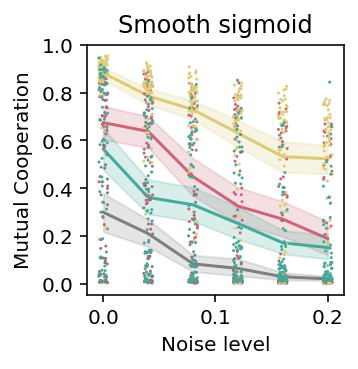

In [19]:
#@title **Fig. S2a**: Smooth sigmoid

deceitcost_facet = 0.0
divorcecost_facet = 4.0
playcost_facet = 0.0
allowdeceit_facet = False
allowdivorce_facet = True
noisetype_facet = "percept"
deaths_facet = 0.01
mutation_facet = 0.04
population_facet = 500

df_tmp = prepare_dataframe(df_smooth_sigmoid)

df_figS2a = df_tmp[
    (df_tmp.deceitcost == deceitcost_facet) &
    (df_tmp.divorcecost == divorcecost_facet) &
    (df_tmp.playcost == playcost_facet) &
    (df_tmp.allowdeceit == allowdeceit_facet) &
    (df_tmp.allowdivorce == allowdivorce_facet) &
    ((df_tmp.noisetype == noisetype_facet) | (df_tmp.noisetype == 'neither')) &
    (df_tmp.deaths == deaths_facet) &
    (df_tmp.mutation == mutation_facet) &
    (df_tmp.population == population_facet)
]

plot_emocourt_vs_noise_and_save(df_figS2a, 'Smooth sigmoid')

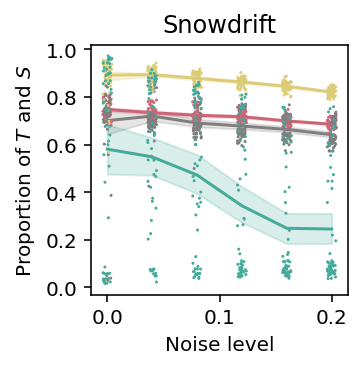

In [20]:
#@title **Fig. S2b**: Snowdrift

df_tmp = prepare_dataframe(df_chicken)
df_tmp['Mutual Cooperation'] = df_tmp['p_S'] + df_tmp['p_T']

df_figS2b = df_tmp[
    (df_tmp.deceitcost == deceitcost_facet) &
    (df_tmp.divorcecost == divorcecost_facet) &
    (df_tmp.playcost == playcost_facet) &
    (df_tmp.allowdeceit == allowdeceit_facet) &
    (df_tmp.allowdivorce == allowdivorce_facet) &
    ((df_tmp.noisetype == noisetype_facet) | (df_tmp.noisetype == 'neither')) &
    (df_tmp.deaths == deaths_facet) &
    (df_tmp.mutation == mutation_facet) &
    (df_tmp.population == population_facet)
]

plot_emocourt_vs_noise_and_save(df_figS2b, 'Snowdrift', ylabel='Proportion of $T$ and $S$')

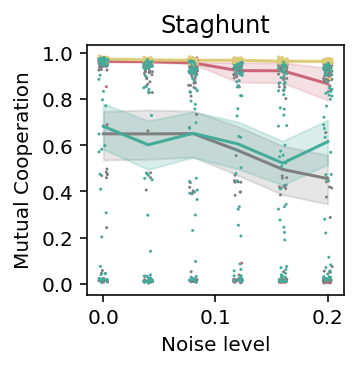

In [21]:
#@title **Fig. S2c**: Staghunt

df_tmp = prepare_dataframe(df_staghunt)

df_figS2c = df_tmp[
    (df_tmp.deceitcost == deceitcost_facet) &
    (df_tmp.divorcecost == divorcecost_facet) &
    (df_tmp.playcost == playcost_facet) &
    (df_tmp.allowdeceit == allowdeceit_facet) &
    (df_tmp.allowdivorce == allowdivorce_facet) &
    ((df_tmp.noisetype == noisetype_facet) | (df_tmp.noisetype == 'neither')) &
    (df_tmp.deaths == deaths_facet) &
    (df_tmp.mutation == mutation_facet) &
    (df_tmp.population == population_facet)
]

plot_emocourt_vs_noise_and_save(df_figS2c, 'Staghunt')

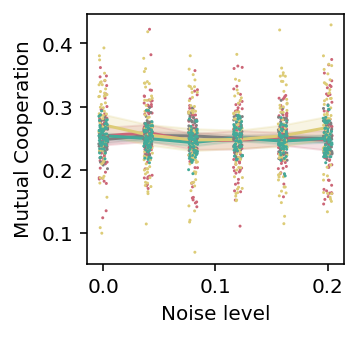

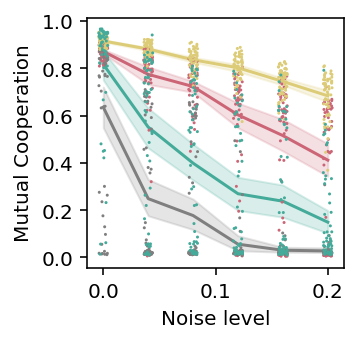

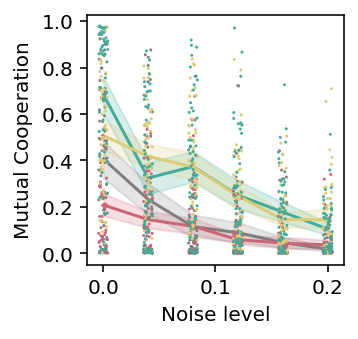

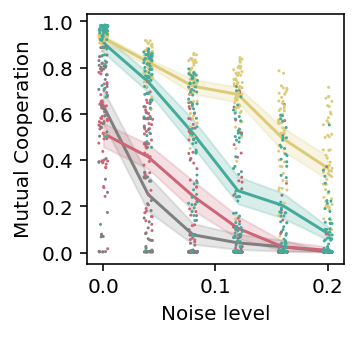

In [22]:
#@title **Fig. S3a**: Mortality vs Population size

df_tmp = prepare_dataframe(df_death_and_pop_size)

for mortality in df_tmp['deaths'].unique():
  for pop_size in df_tmp['population'].unique():
    df_figS3a = df_tmp[
        (df_tmp.deceitcost == deceitcost_facet) &
        (df_tmp.divorcecost == divorcecost_facet) &
        (df_tmp.playcost == playcost_facet) &
        (df_tmp.allowdeceit == allowdeceit_facet) &
        (df_tmp.allowdivorce == allowdivorce_facet) &
        ((df_tmp.noisetype == noisetype_facet) | (df_tmp.noisetype == 'neither')) &
        (df_tmp.deaths == mortality) &
        (df_tmp.mutation == mutation_facet) &
        (df_tmp.population == pop_size)
    ]

    plot_emocourt_vs_noise_and_save(df_figS3a, '')

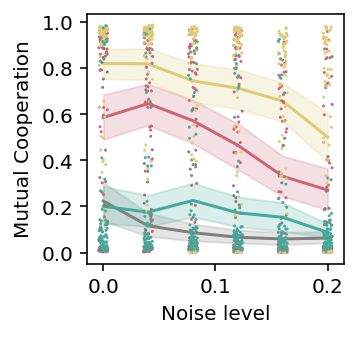

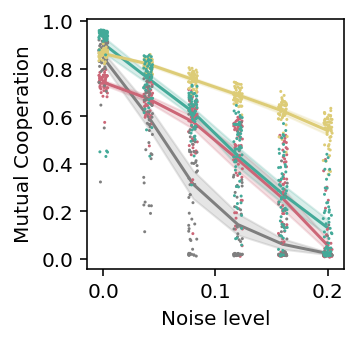

In [23]:
#@title **Fig. S3b**: Mutation

df_tmp = prepare_dataframe(df_mutation)

for mutation in df_tmp['mutation'].unique():
  df_figS3b = df_tmp[
      (df_tmp.deceitcost == deceitcost_facet) &
      (df_tmp.divorcecost == divorcecost_facet) &
      (df_tmp.playcost == playcost_facet) &
      (df_tmp.allowdeceit == allowdeceit_facet) &
      (df_tmp.allowdivorce == allowdivorce_facet) &
      ((df_tmp.noisetype == noisetype_facet) | (df_tmp.noisetype == 'neither')) &
      (df_tmp.deaths == deaths_facet) &
      (df_tmp.mutation == mutation) &
      (df_tmp.population == population_facet)
  ]

  plot_emocourt_vs_noise_and_save(df_figS3b, '')

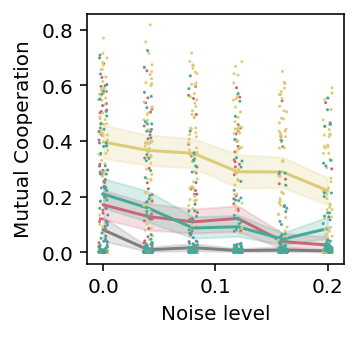

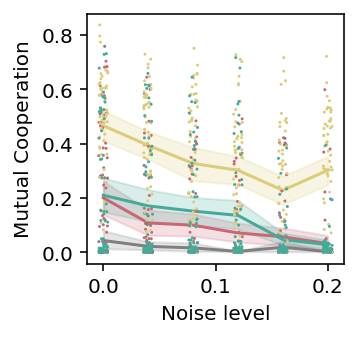

In [24]:
#@title **Fig. S3c**: Initial trait and Deviation

df_tmp = prepare_dataframe(df_initial_trait_low_dev)
df_figS3c = df_tmp[
    (df_tmp.deceitcost == deceitcost_facet) &
    (df_tmp.divorcecost == divorcecost_facet) &
    (df_tmp.playcost == playcost_facet) &
    (df_tmp.allowdeceit == allowdeceit_facet) &
    (df_tmp.allowdivorce == allowdivorce_facet) &
    ((df_tmp.noisetype == noisetype_facet) | (df_tmp.noisetype == 'neither')) &
    (df_tmp.deaths == deaths_facet) &
    (df_tmp.mutation == mutation_facet) &
    (df_tmp.population == population_facet)
]
plot_emocourt_vs_noise_and_save(df_figS3c, '')

df_tmp = prepare_dataframe(df_initial_trait)
df_figS3c = df_tmp[
    (df_tmp.deceitcost == deceitcost_facet) &
    (df_tmp.divorcecost == divorcecost_facet) &
    (df_tmp.playcost == playcost_facet) &
    (df_tmp.allowdeceit == allowdeceit_facet) &
    (df_tmp.allowdivorce == allowdivorce_facet) &
    ((df_tmp.noisetype == noisetype_facet) | (df_tmp.noisetype == 'neither')) &
    (df_tmp.deaths == deaths_facet) &
    (df_tmp.mutation == mutation_facet) &
    (df_tmp.population == population_facet)
]
plot_emocourt_vs_noise_and_save(df_figS3c, '')


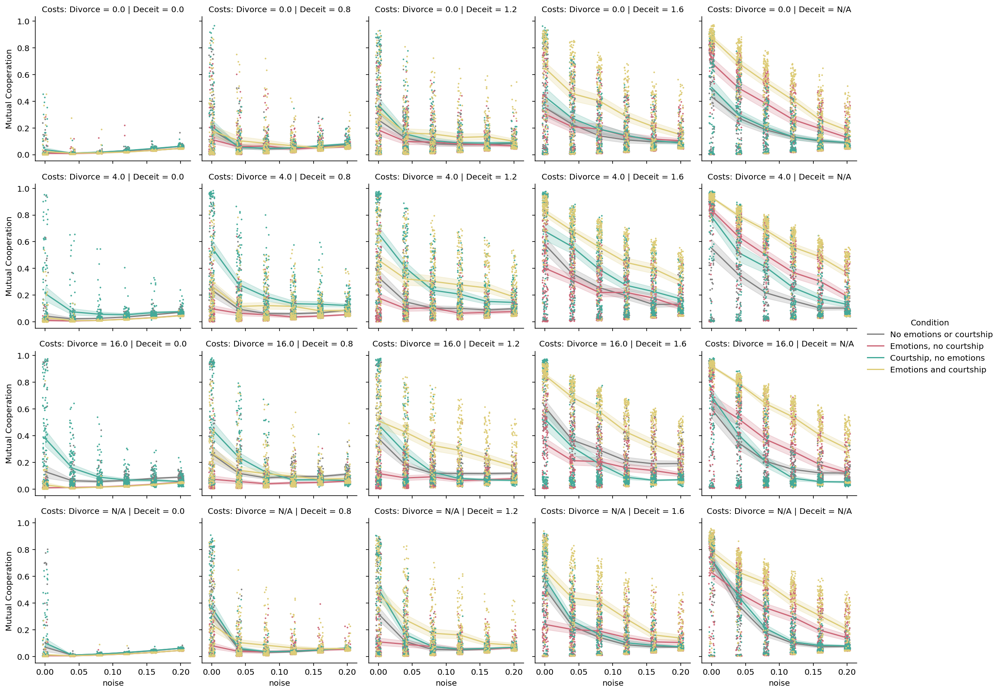

In [25]:
#@title **Fig. S4**: Facet grid for Deceit and Divorce Cost levels (Action noise)
dfn = df[df['deaths'] == 0.01]
dfn = dfn[dfn['mutation'] == 0.04]
dfn = pd.concat([dfn[dfn['noisetype'] == 'action'],
                 dfn[dfn['noisetype'] == 'neither']])  # Use "percept" here for perceptual noise, "action" for action noise
dfn = pd.concat([dfn[dfn['Costs: Play'] == 'N/A'],
                 dfn[dfn['Costs: Play'] == '0.0']])
def_pal = sns.color_palette()
hue_order = ['No emotions or courtship', 'Emotions, no courtship',
             'Courtship, no emotions', 'Emotions and courtship']
palette = [def_pal[7], '#CC6677', '#44AA99', '#DDCC77']
dfn['allowdivorce'].replace(to_replace={False: 'No divorce',
                                        'False 0.0': 'Courtship, no emotions',
                                        'True N/A': 'Emotions, no courtship',
                                        'True 0.0': 'Emotions and courtship'},
                            inplace=True, limit=None, regex=False)
g = sns.FacetGrid(dfn,
                  row='Costs: Divorce',
                  col='Deceit',
                  row_order=['0.0','4.0','16.0','N/A'],
                  col_order=['0.0','0.8','1.2','1.6','N/A'],
                  hue = 'EmoCourt',
                  palette=palette,
                  hue_order=hue_order)
g.map(sns.stripplot, 'noise', 'Mutual Cooperation', dodge=True,
      order =[0.0,0.04,0.08,0.12,0.16,0.20], native_scale=True, size=2)
g.map(sns.lineplot, 'noise', 'Mutual Cooperation')
g.add_legend(title="Condition")

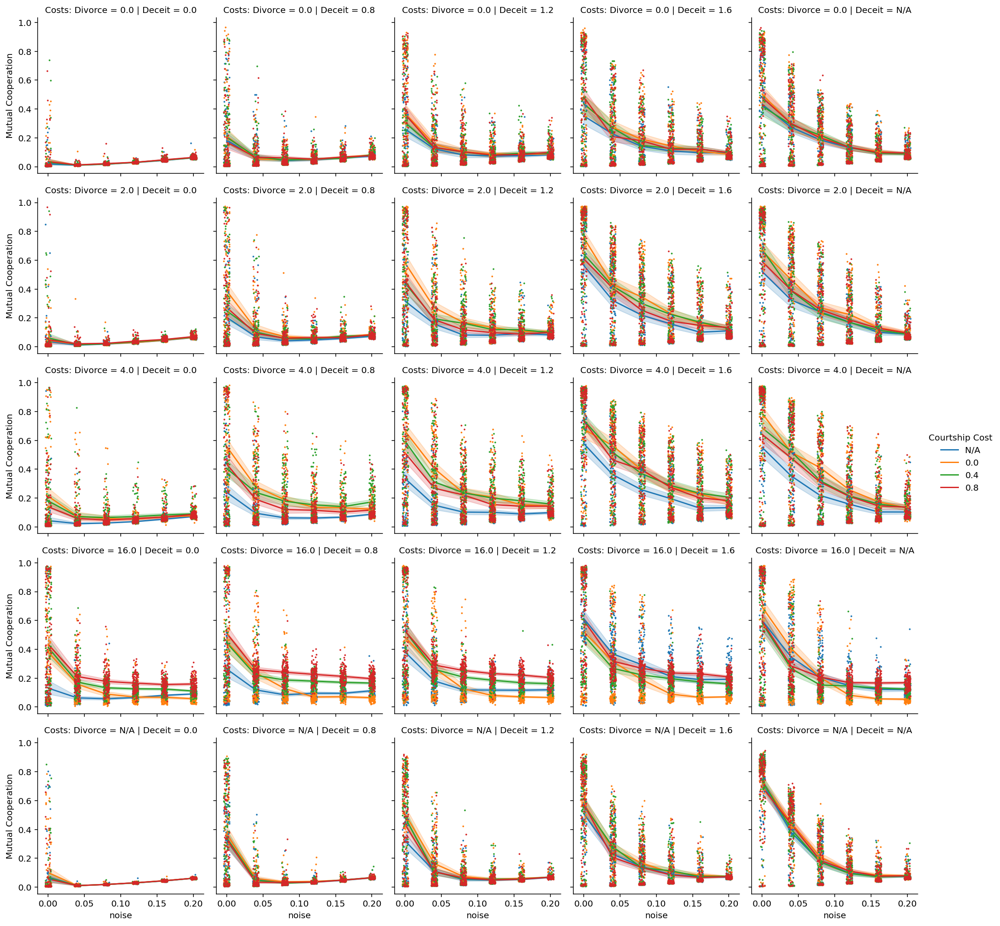

In [26]:
#@title **Fig. S5**: Facet grid for Courtship Cost levels (No emotions, Action noise)
dfn = df[df['deaths'] == 0.01]
dfn = dfn[dfn['mutation'] == 0.04]
dfn = dfn[dfn['emotions'] == False]  # Set to True for emotions, False for no emotions
dfn = pd.concat([dfn[dfn['noisetype'] == 'action'],
                 dfn[dfn['noisetype'] == 'neither']])  # Use "percept" here for perceptual noise, "action" for action noise
dfn = pd.concat([dfn[dfn['Costs: Play'] == 'N/A'],
                 dfn[dfn['Costs: Play'] == '0.0'],
                 dfn[dfn['Costs: Play'] == '0.4'],
                 dfn[dfn['Costs: Play'] == '0.8']])

g = sns.FacetGrid(dfn,
                  col='Deceit',
                  row='Costs: Divorce',
                  col_order=['0.0','0.8','1.2','1.6','N/A'],
                  row_order=['0.0', '2.0', '4.0','16.0','N/A'],
                  hue="Costs: Play")
g.map(sns.stripplot, 'noise', 'Mutual Cooperation', dodge=True,
      order=[0.0,0.04,0.08,0.12,0.16,0.2], native_scale=True, size=2)
g.map(sns.lineplot, 'noise', 'Mutual Cooperation')
g.add_legend(title="Courtship Cost")


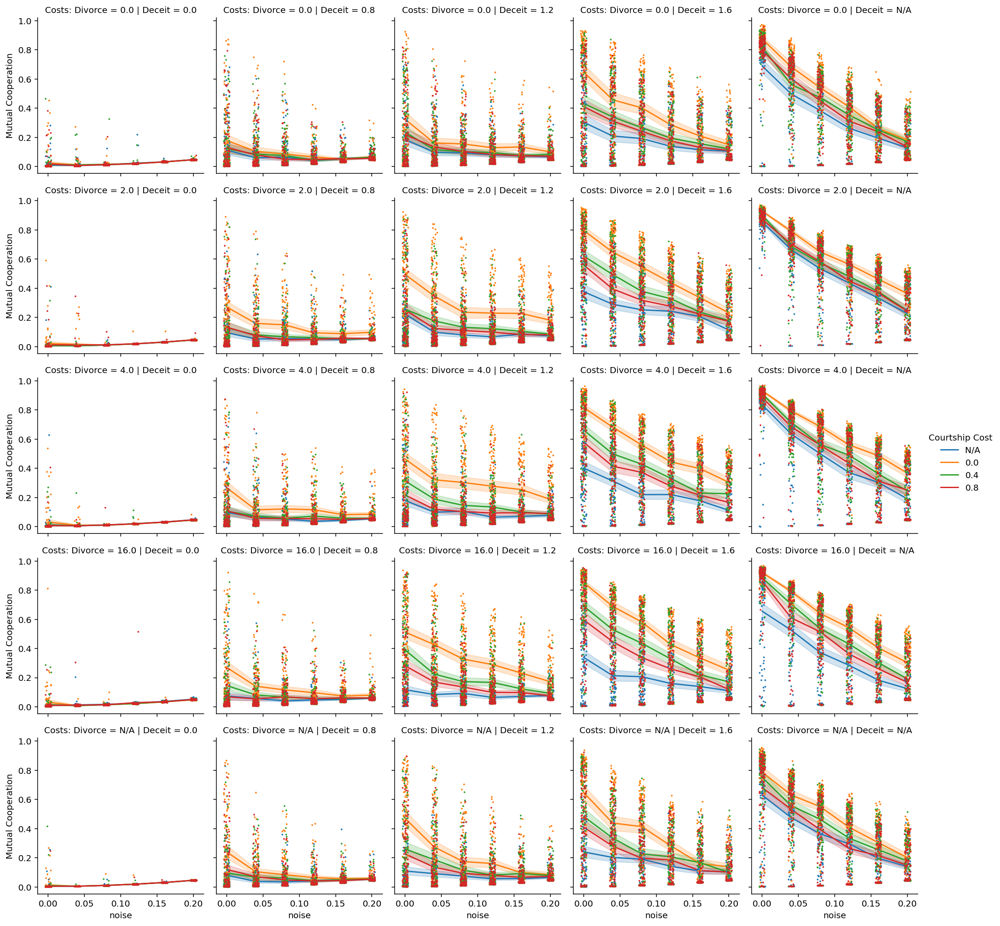

In [27]:
#@title **Fig. S6**: Facet grid for Courtship Cost levels (Emotions, Action noise)
dfn = df[df['deaths'] == 0.01]
dfn = dfn[dfn['mutation'] == 0.04]
dfn = dfn[dfn['emotions'] == True]  # Set to True for emotions, False for no emotions
dfn = pd.concat([dfn[dfn['noisetype'] == 'action'],
                 dfn[dfn['noisetype'] == 'neither']])  # Use "percept" here for perceptual noise, "action" for action noise
dfn = pd.concat([dfn[dfn['Costs: Play'] == 'N/A'],
                 dfn[dfn['Costs: Play'] == '0.0'],
                 dfn[dfn['Costs: Play'] == '0.4'],
                 dfn[dfn['Costs: Play'] == '0.8']])

g = sns.FacetGrid(dfn,
                  col='Deceit',
                  row='Costs: Divorce',
                  col_order=['0.0','0.8','1.2','1.6','N/A'],
                  row_order=['0.0', '2.0', '4.0','16.0','N/A'],
                  hue="Costs: Play")
g.map(sns.stripplot, 'noise', 'Mutual Cooperation', dodge=True,
      order=[0.0,0.04,0.08,0.12,0.16,0.2], native_scale=True, size=2)
g.map(sns.lineplot, 'noise', 'Mutual Cooperation')
g.add_legend(title="Courtship Cost")


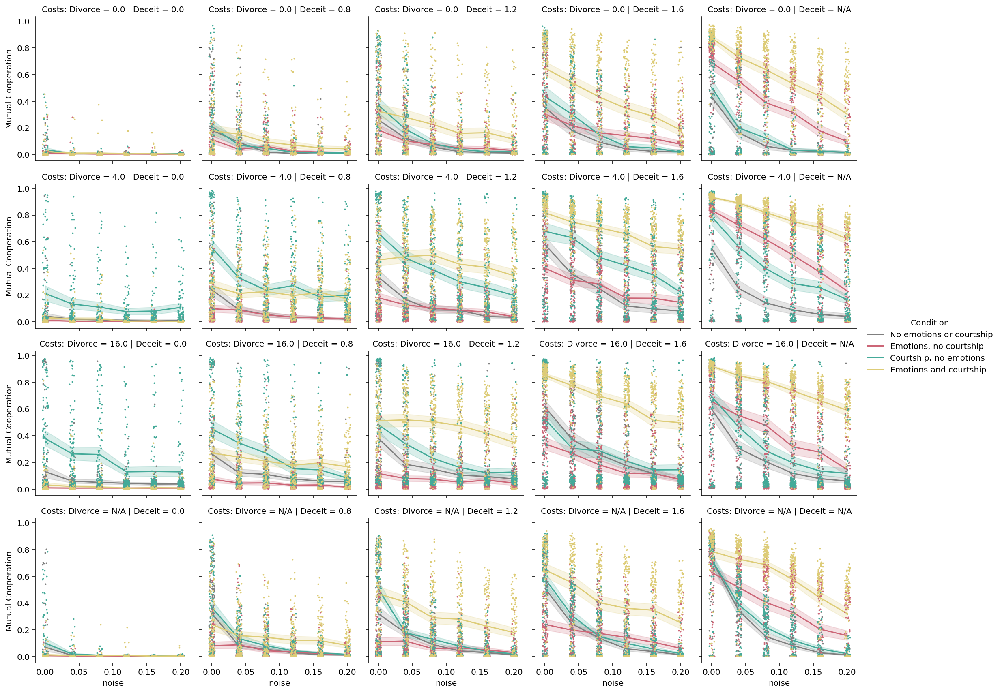

In [28]:
#@title **Fig. S7**: Facet grid for Deceit and Divorce Cost levels (Perceptual noise)
dfn = df[df['deaths'] == 0.01]
dfn = dfn[dfn['mutation'] == 0.04]
dfn = pd.concat([dfn[dfn['noisetype'] == 'percept'],
                 dfn[dfn['noisetype'] == 'neither']])  # Use "percept" here for perceptual noise, "action" for action noise
dfn = pd.concat([dfn[dfn['Costs: Play'] == 'N/A'],
                 dfn[dfn['Costs: Play'] == '0.0']])
def_pal = sns.color_palette()
hue_order = ['No emotions or courtship', 'Emotions, no courtship',
             'Courtship, no emotions', 'Emotions and courtship']
palette = [def_pal[7], '#CC6677', '#44AA99', '#DDCC77']
dfn['allowdivorce'].replace(to_replace={False: 'No divorce',
                                        'False 0.0': 'Courtship, no emotions',
                                        'True N/A': 'Emotions, no courtship',
                                        'True 0.0': 'Emotions and courtship'},
                            inplace=True, limit=None, regex=False)
g = sns.FacetGrid(dfn,
                  row='Costs: Divorce',
                  col='Deceit',
                  row_order=['0.0','4.0','16.0','N/A'],
                  col_order=['0.0','0.8','1.2','1.6','N/A'],
                  hue = 'EmoCourt',
                  palette=palette,
                  hue_order=hue_order)
g.map(sns.stripplot, 'noise', 'Mutual Cooperation', dodge=True,
      order =[0.0,0.04,0.08,0.12,0.16,0.20], native_scale=True, size=2)
g.map(sns.lineplot, 'noise', 'Mutual Cooperation')
g.add_legend(title="Condition")

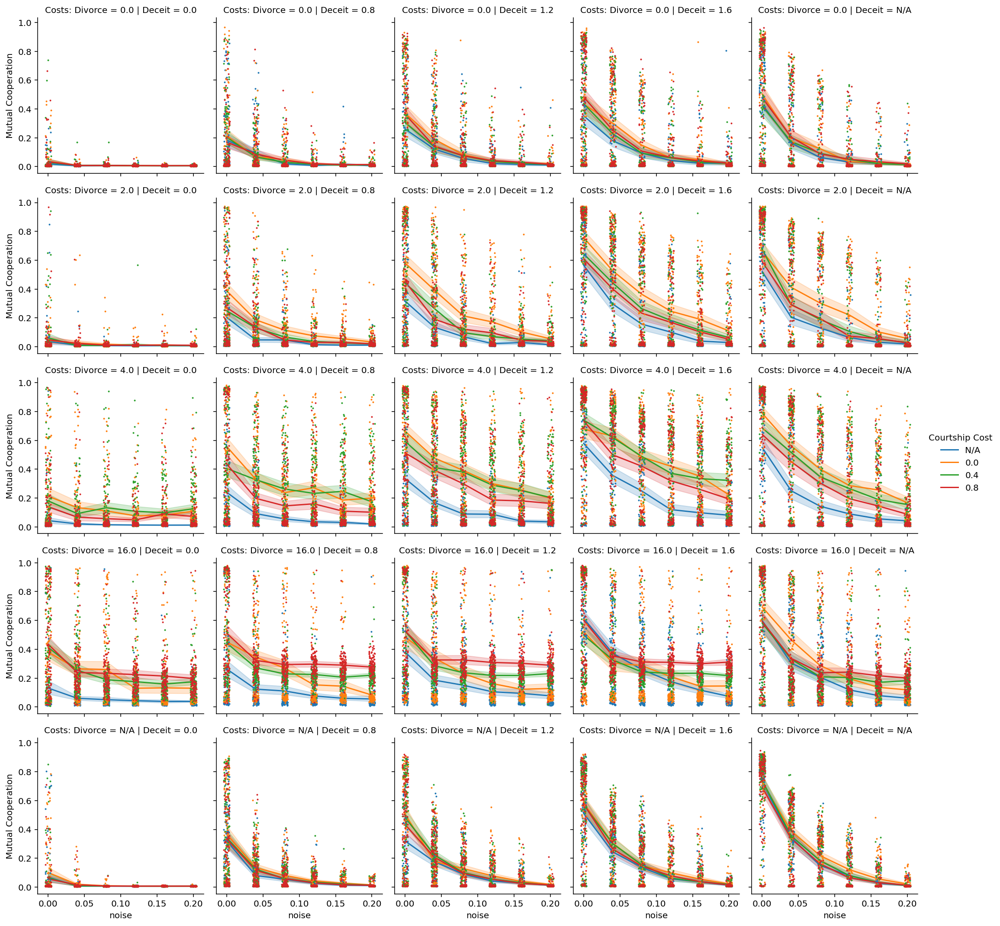

In [29]:
#@title **Fig. S8**: Facet grid for Courtship Cost levels (No emotions, Perceptual noise)
dfn = df[df['deaths'] == 0.01]
dfn = dfn[dfn['mutation'] == 0.04]
dfn = dfn[dfn['emotions'] == False]  # Set to True for emotions, False for no emotions
dfn = pd.concat([dfn[dfn['noisetype'] == 'percept'],
                 dfn[dfn['noisetype'] == 'neither']])  # Use "percept" here for perceptual noise, "action" for action noise
dfn = pd.concat([dfn[dfn['Costs: Play'] == 'N/A'],
                 dfn[dfn['Costs: Play'] == '0.0'],
                 dfn[dfn['Costs: Play'] == '0.4'],
                 dfn[dfn['Costs: Play'] == '0.8']])

g = sns.FacetGrid(dfn,
                  col='Deceit',
                  row='Costs: Divorce',
                  col_order=['0.0','0.8','1.2','1.6','N/A'],
                  row_order=['0.0', '2.0', '4.0','16.0','N/A'],
                  hue="Costs: Play")
g.map(sns.stripplot, 'noise', 'Mutual Cooperation', dodge=True,
      order=[0.0,0.04,0.08,0.12,0.16,0.2], native_scale=True, size=2)
g.map(sns.lineplot, 'noise', 'Mutual Cooperation')
g.add_legend(title="Courtship Cost")


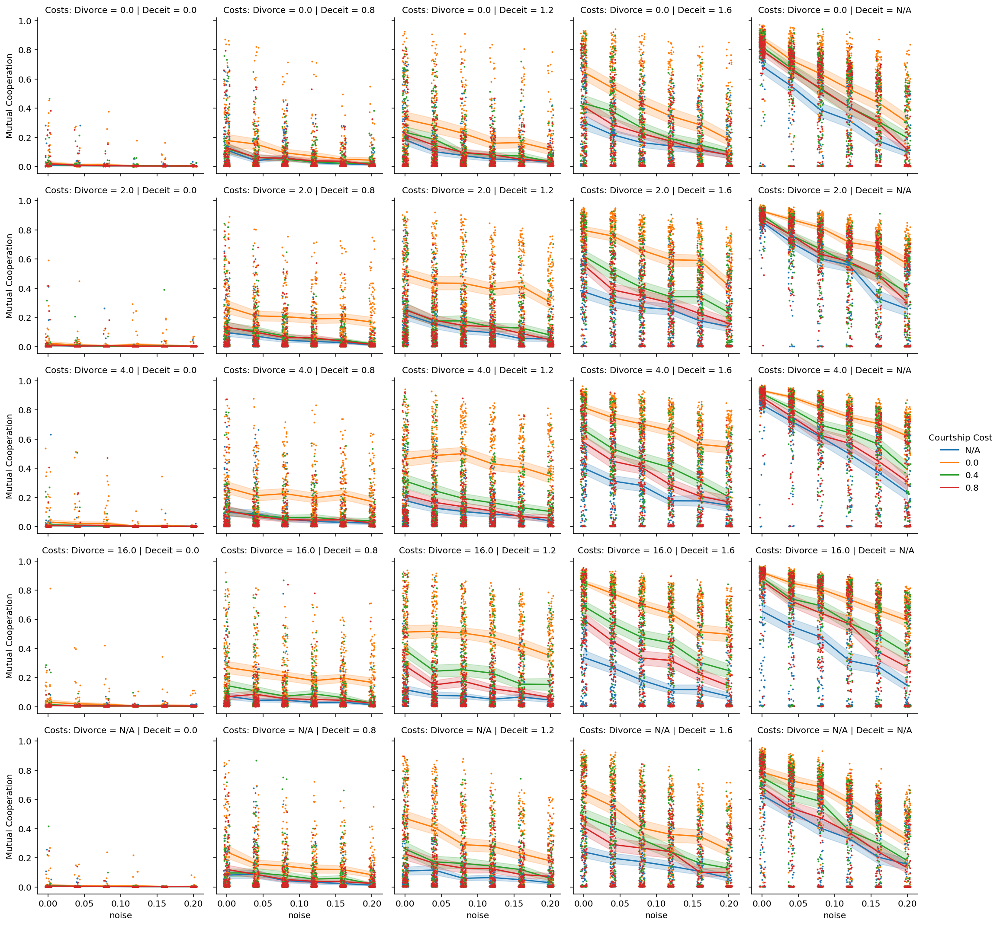

In [30]:
#@title **Fig. S9**: Facet grid for Courtship Cost levels (Emotions, Perceptual noise)
dfn = df[df['deaths'] == 0.01]
dfn = dfn[dfn['mutation'] == 0.04]
dfn = dfn[dfn['emotions'] == True]  # Set to True for emotions, False for no emotions
dfn = pd.concat([dfn[dfn['noisetype'] == 'percept'],
                 dfn[dfn['noisetype'] == 'neither']])  # Use "percept" here for perceptual noise, "action" for action noise
dfn = pd.concat([dfn[dfn['Costs: Play'] == 'N/A'],
                 dfn[dfn['Costs: Play'] == '0.0'],
                 dfn[dfn['Costs: Play'] == '0.4'],
                 dfn[dfn['Costs: Play'] == '0.8']])

g = sns.FacetGrid(dfn,
                  col='Deceit',
                  row='Costs: Divorce',
                  col_order=['0.0','0.8','1.2','1.6','N/A'],
                  row_order=['0.0', '2.0', '4.0','16.0','N/A'],
                  hue="Costs: Play")
g.map(sns.stripplot, 'noise', 'Mutual Cooperation', dodge=True,
      order=[0.0,0.04,0.08,0.12,0.16,0.2], native_scale=True, size=2)
g.map(sns.lineplot, 'noise', 'Mutual Cooperation')
g.add_legend(title="Courtship Cost")


In [31]:
#@title Prepare table for statistical analyses

hist_df['PriorEmotion'] = (
    hist_df['emotions'].astype(str) + hist_df['start_point'].astype(str))
hist_df.replace(to_replace={'FalseNone':'N/A', 'True1.0':'Positive',
                            'True0.0':'Neutral', 'True-1.0':'Negative'},
                inplace=True, limit=None, regex=False)
hist_df['dif'] = 0
for strat, generous in zip(
    ('Opportunist', 'TFT', 'WSLS', 'Trigger', 'NoS'),
    ('Generous Opportunist', 'Generous TFT', 'Generous WSLS',
     'Generous Trigger', 'Cooperator')):
    # dif is the prop of conditional coops who coop on s
    hist_df['dif'] += hist_df[strat]/(hist_df[strat] + hist_df[generous])/4
mod = ols('dif ~ noise + allowdeceit + emotions + allowplay + PriorEmotion',
          data = hist_df).fit()
sm.stats.anova_lm(mod, typ=2)

,sum_sq,df,F,PR(>F)
allowdeceit,0.112153,1.0,1.982431,1.605993e-01
emotions,0.037924,1.0,0.670355,4.138474e-01
allowplay,0.028881,1.0,0.510496,4.757102e-01
PriorEmotion,4.569116,3.0,26.921312,8.569604e-15
noise,0.020180,1.0,0.356710,5.509762e-01
Residual,11.993628,212.0,NaN,NaN


In [32]:
#@title **Table S2**: MANOVA
#@markdown `Opportunist + TFT + Defector + WSLS + NoS + Trigger + genOpportunist + genTFT + genWSLS + genTrigger + Cooperator + Quitter ~ allowdeceit + allowplay + emotions + noise`

hist_df['genOpportunist'] = hist_df['Generous Opportunist']
hist_df['genTFT'] = hist_df['Generous TFT']
hist_df['genTrigger'] = hist_df['Generous Trigger']
hist_df['genWSLS'] = hist_df['Generous WSLS']

fit = MANOVA.from_formula(
    'Opportunist + TFT + Defector + WSLS + NoS + Trigger + genOpportunist + '
    'genTFT + genWSLS + genTrigger + Cooperator + Quitter '
    '~ allowdeceit + allowplay + noise + emotions', data=hist_df)
print(fit.mv_test())


                                  Multivariate linear model
                                                                                              
----------------------------------------------------------------------------------------------
       Intercept                Value          Num DF   Den DF          F Value         Pr > F
----------------------------------------------------------------------------------------------
          Wilks' lambda               -0.0000 12.0000 1136.0000 -53292595590550968.0000 1.0000
         Pillai's trace                1.0000 12.0000 1136.0000 -53292595590550968.0000 1.0000
 Hotelling-Lawley trace -562949953421313.0000 12.0000 1136.0000 -53292595590550968.0000 1.0000
    Roy's greatest root -562949953421313.0000 12.0000 1136.0000 -53292595590550968.0000 1.0000
----------------------------------------------------------------------------------------------
                                                                                     

In [33]:
#@title Format it for Latex
def frmt(x):
  if isinstance(x, str):
    return x
  else:
    return '{:,.3f}'.format(x)


print('\\begin{tabular}{lrrrrr}')
print(' & Value & Num DF & Den DF & $F$ value & Pr $> F$\\\\')

for result in fit.mv_test().results:
  print('\\toprule[1pt]')
  print(result, '\\\\ \\hline')
  tmp = fit.mv_test().results[result]['stat']
  for x in tmp.reset_index().apply(lambda r: ' & '.join(list(r.map(frmt))), axis=1):
    print(x, '\\\\')

print('\\bottomrule[1pt]')
print('\\end{tabular}')

\begin{tabular}{lrrrrr}
 & Value & Num DF & Den DF & $F$ value & Pr $> F$\\
\toprule[1pt]
Intercept \\ \hline
Wilks' lambda & -0.000 & 12.000 & 1,136.000 & -53,292,595,590,550,968.000 & 1.000 \\
Pillai's trace & 1.000 & 12.000 & 1,136.000 & -53,292,595,590,550,968.000 & 1.000 \\
Hotelling-Lawley trace & -562,949,953,421,313.000 & 12.000 & 1,136.000 & -53,292,595,590,550,968.000 & 1.000 \\
Roy's greatest root & -562,949,953,421,313.000 & 12.000 & 1,136.000 & -53,292,595,590,550,968.000 & 1.000 \\
\toprule[1pt]
allowdeceit \\ \hline
Wilks' lambda & 0.970 & 11.000 & 1,137.000 & 3.237 & 0.000 \\
Pillai's trace & 0.030 & 11.000 & 1,137.000 & 3.237 & 0.000 \\
Hotelling-Lawley trace & 0.031 & 11.000 & 1,137.000 & 3.237 & 0.000 \\
Roy's greatest root & 0.031 & 11.000 & 1,137.000 & 3.237 & 0.000 \\
\toprule[1pt]
allowplay \\ \hline
Wilks' lambda & 0.880 & 11.000 & 1,137.000 & 14.049 & 0.000 \\
Pillai's trace & 0.120 & 11.000 & 1,137.000 & 14.059 & 0.000 \\
Hotelling-Lawley trace & 0.136 & 11.00

In [34]:
#@title **Table S3**: Individual ANOVAs (generous)

def frmt(x):
  if isinstance(x, str):
    return {
        'allowdeceit': 'Deceit',
        'allowplay': 'Courtship',
        'emotions': 'emotions',
        'PriorEmotion': 'PriorEmotion',
        'noise': 'Noise',
        'Residual': 'Residual',
    }[x]  # Map to name
  else:
    return '{:,.3f}'.format(x)

def name_strat(strat: str) -> str:
  if strat == 'TFT':
    return 'Reciprocator'
  if strat == 'genWSLS':
    return 'Generous WSLS-like'
  if strat.startswith('gen'):
    return 'Generous ' + strat[3:]
  return strat

def _process_row(row) -> str:
  row.iloc[-1] = correct_p_val(row.iloc[-1])
  return ' & '.join(list(row.map(frmt)))


hist_df_nona = hist_df.dropna().copy()
hist_df_nona['group'] = (
    hist_df_nona.emotions.apply(lambda x: 'E' if x else 'e') +
    hist_df_nona.allowdeceit.apply(lambda x: 'D' if x else 'd') +
    hist_df_nona.allowplay.apply(lambda x: 'C' if x else 'c'))

strategies = [
    'Cooperator',
    'genOpportunist',
    'genTFT',
    'genTrigger',
    'genWSLS',
    'Quitter',
]
alpha = 1 - pow(0.95, 1/len(strategies))
correct_p_val = lambda p: 1 - pow(1-p, len(strategies))

pd.options.display.float_format = '{:,.3f}'.format

print('\\begin{tabular}{lrrrrr}')

for strat in strategies:
  stratstr = strat + ' ~ noise + allowdeceit + allowplay + emotions + PriorEmotion'
  print('\\toprule[1pt]')
  print(name_strat(strat), '\\\\ \\hline')
  print(' & Sum of squares & df & $F$ value & Pr $> F$ \\\\')
  print('\\midrule')
  mod = ols(stratstr, data = hist_df_nona).fit()
  aov_table = sm.stats.anova_lm(mod, typ =2)
  for x in aov_table.reset_index().apply(_process_row, axis=1):
    print(x, '\\\\')

print('\\bottomrule[1pt]')
print('\\end{tabular}')


\begin{tabular}{lrrrrr}
\toprule[1pt]
Cooperator \\ \hline
 & Sum of squares & df & $F$ value & Pr $> F$ \\
\midrule
Deceit & 0.000 & 1.000 & 0.027 & 1.000 \\
Courtship & 0.131 & 1.000 & 17.234 & 0.000 \\
emotions & 0.000 & 1.000 & 0.047 & 1.000 \\
PriorEmotion & 0.715 & 3.000 & 31.386 & 0.000 \\
Noise & 0.120 & 1.000 & 15.868 & 0.001 \\
Residual & 1.609 & 212.000 & nan & nan \\
\toprule[1pt]
Generous Opportunist \\ \hline
 & Sum of squares & df & $F$ value & Pr $> F$ \\
\midrule
Deceit & 0.003 & 1.000 & 1.306 & 0.828 \\
Courtship & 0.000 & 1.000 & 0.029 & 1.000 \\
emotions & 0.024 & 1.000 & 9.367 & 0.015 \\
PriorEmotion & 0.046 & 3.000 & 6.027 & 0.004 \\
Noise & 0.001 & 1.000 & 0.399 & 0.989 \\
Residual & 0.539 & 212.000 & nan & nan \\
\toprule[1pt]
Generous TFT \\ \hline
 & Sum of squares & df & $F$ value & Pr $> F$ \\
\midrule
Deceit & 0.000 & 1.000 & 0.021 & 1.000 \\
Courtship & 0.002 & 1.000 & 0.490 & 0.981 \\
emotions & 0.054 & 1.000 & 17.180 & 0.000 \\
PriorEmotion & 0.191 & 3.0

In [35]:
#@title **Table S4**: Individual ANOVAs (non generous)

hist_df_nona = hist_df.dropna().copy()
hist_df_nona['group'] = (
    hist_df_nona.emotions.apply(lambda x: 'E' if x else 'e') +
    hist_df_nona.allowdeceit.apply(lambda x: 'D' if x else 'd') +
    hist_df_nona.allowplay.apply(lambda x: 'C' if x else 'c'))

strategies = [
    'Defector',
    'NoS',
    'Opportunist',
    'TFT',
    'Trigger',
    'WSLS',
    'Quitter',
]
alpha = 1 - pow(0.95, 1/len(strategies))
correct_p_val = lambda p: 1 - pow(1-p, len(strategies))

pd.options.display.float_format = '{:,.3f}'.format

print('\\begin{tabular}{lrrrrr}')

for strat in strategies:
  stratstr = strat + ' ~ noise + allowdeceit + allowplay + emotions + PriorEmotion'
  print('\\toprule[1pt]')
  print(name_strat(strat), '\\\\ \\hline')
  print(' & Sum of squares & df & $F$ value & Pr $> F$ \\\\')
  print('\\midrule')
  mod = ols(stratstr, data = hist_df_nona).fit()
  aov_table = sm.stats.anova_lm(mod, typ =2)
  for x in aov_table.reset_index().apply(_process_row, axis=1):
    print(x, '\\\\')

print('\\bottomrule[1pt]')
print('\\end{tabular}')

\begin{tabular}{lrrrrr}
\toprule[1pt]
Defector \\ \hline
 & Sum of squares & df & $F$ value & Pr $> F$ \\
\midrule
Deceit & 0.298 & 1.000 & 9.475 & 0.016 \\
Courtship & 0.635 & 1.000 & 20.175 & 0.000 \\
emotions & 0.161 & 1.000 & 5.120 & 0.160 \\
PriorEmotion & 1.130 & 3.000 & 11.968 & 0.000 \\
Noise & 0.677 & 1.000 & 21.494 & 0.000 \\
Residual & 6.675 & 212.000 & nan & nan \\
\toprule[1pt]
NoS \\ \hline
 & Sum of squares & df & $F$ value & Pr $> F$ \\
\midrule
Deceit & 0.014 & 1.000 & 0.504 & 0.990 \\
Courtship & 0.199 & 1.000 & 7.378 & 0.049 \\
emotions & 0.000 & 1.000 & 0.002 & 1.000 \\
PriorEmotion & 0.401 & 3.000 & 4.955 & 0.017 \\
Noise & 0.207 & 1.000 & 7.686 & 0.042 \\
Residual & 5.713 & 212.000 & nan & nan \\
\toprule[1pt]
Opportunist \\ \hline
 & Sum of squares & df & $F$ value & Pr $> F$ \\
\midrule
Deceit & 0.079 & 1.000 & 3.673 & 0.335 \\
Courtship & 0.000 & 1.000 & 0.000 & 1.000 \\
emotions & 0.016 & 1.000 & 0.751 & 0.967 \\
PriorEmotion & 0.208 & 3.000 & 3.238 & 0.151 \\